In [34]:
import os
### QAOA_realestate가 있는 폴더로 지정
dir_path = "/Users/minhyeong-gyu/Documents/GitHub/QuantumVariableSelection"
os.chdir(dir_path)
import sys
module_path = dir_path + "/Module"
if module_path not in sys.path:
    sys.path.append(module_path)

from optimizer import optimizer as opt
from optimizer import basefunctions as bf

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
from matplotlib import font_manager, rc
# 윈도우 한글 폰트
# font_path = "C:/Windows/Fonts/NGULIM.TTF"
# font = font_manager.FontProperties(fname=font_path).get_name()
# rc('font', family=font)

# Mac 한글 폰트
rc('font', family='AppleGothic')
plt.rcParams['axes.unicode_minus'] = True

import seaborn as sns
from dwave.system import LeapHybridCQMSampler
%matplotlib inline

In [35]:
lmbd_list = [0,0.001,0.002,0.005,0.01,0.02,0.05,0.1,0.2,0.5,1]

sa_mi_stat = []
sa_full_stat = []
sa_partial_stat = []

for j in lmbd_list :
    sa_mi_lmbd = []
    sa_full_lmbd = []
    sa_partial_lmbd = []

    for i in range(5):
        n_features = None
        number_influentials = 8
        number_features = 40
        number_samples = 2000
        covariance_parameter = 100
        lmbd = j
        beta_coef = np.concatenate([np.random.normal(10,1,number_influentials),np.zeros(number_features-number_influentials)])
        epsilon = 0
        X,y = bf.generate_dependent_sample_logistic(number_samples,number_features,beta_coef,covariance_parameter=covariance_parameter,epsilon=epsilon)
        y_type="binary"
        sa_mi = opt.SimulatedAnnealing("QUBO",y_type=y_type,measure="mi")
        sa_mi_result = sa_mi.optimize(X,y,lmbd,reps=10,n_features=n_features)
        sa_full = opt.SimulatedAnnealing("QUBO",y_type=y_type,measure="full")
        sa_full_result = sa_full.optimize(X,y,lmbd,reps=10,n_features=n_features)
        sa_partial = opt.SimulatedAnnealing("QUBO",y_type=y_type,measure="partial")
        sa_partial_result = sa_partial.optimize(X,y,lmbd,reps=10,n_features=n_features)
        
        sa_mi_lmbd += [np.sum(sa_mi_result.tolist())]
        sa_full_lmbd += [np.sum(sa_full_result.tolist())]
        sa_partial_lmbd += [np.sum(sa_partial_result.tolist())]

    sa_mi_stat += [np.mean(sa_mi_lmbd)]
    sa_full_stat += [np.mean(sa_full_lmbd)]
    sa_partial_stat += [np.mean(sa_partial_lmbd)]


/Users/minhyeong-gyu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/minhyeong-gyu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_

In [36]:
lambda_analysis = pd.DataFrame([lmbd_list,sa_mi_stat,sa_full_stat,sa_partial_stat]).T
lambda_analysis.columns = ["lambda","MIC","Ord","Partial"]


In [37]:
lambda_analysis

,lambda,MIC,Ord,Partial
0,0.000,39.0,39.0,30.0
1,0.001,27.6,28.4,20.4
2,0.002,22.4,26.6,17.4
3,0.005,13.0,19.4,16.0
4,0.010,6.6,15.2,10.6
5,0.020,3.4,12.0,8.4
6,0.050,0.0,6.6,4.6
7,0.100,0.0,3.8,2.8
8,0.200,0.0,1.0,2.0
9,0.500,0.0,0.2,0.0


Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does n

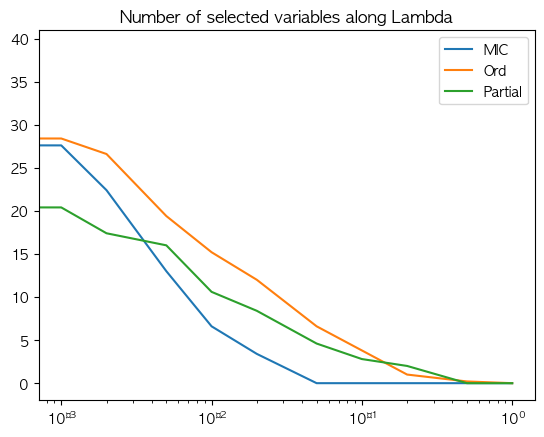

In [38]:
plt.plot("lambda","MIC",data = lambda_analysis)
plt.plot("lambda","Ord",data = lambda_analysis)
plt.plot("lambda","Partial",data = lambda_analysis)
plt.title("Number of selected variables along Lambda")
plt.legend()
plt.xscale("log")
plt.show()

In [39]:
lambda_analysis.to_csv("./result/lambda_simulation.csv")